# Clustering and dimeonsionality reduction techniques combined


In this notebook, we show how the clustering performance changes when dimensionality reduction techniques like Principal component analysis (PCA), Independent component analysis (ICA), or Random projections (RP) is combined with algorithms like k-means.

[Read about ___k-means clustering algorithm___ here.](https://en.wikipedia.org/wiki/K-means_clustering)

[Read about ___principal component analysis___ here](https://en.wikipedia.org/wiki/Principal_component_analysis)

[Read about ___independent component analysis___ here](https://en.wikipedia.org/wiki/Independent_component_analysis)

---

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Create synthetic data using Scikit learn `make_blob` method

- Number of features: 8
- Number of clusters: 5
- Number of samples: 1000

In [2]:
from sklearn.datasets import make_classification
from sklearn.datasets import make_blobs

In [3]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [4]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [5]:
d1 = data1[0]

In [6]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,8.897303,1.393366,-5.607950,14.137991,7.558356,-5.679846,-2.513615,8.267010
1,6.488118,-5.734516,-8.144893,5.468294,10.107007,4.347076,-2.601147,-8.822077
2,4.487338,-3.872456,-9.518186,4.347250,8.401012,5.787761,-1.866114,-7.989653
3,3.556300,-5.866753,-9.407069,3.664104,8.830590,6.510475,1.134258,-6.197391
4,4.471986,8.012252,-8.494171,-5.377378,-8.432277,-11.033595,4.357611,0.449474


In [7]:
from itertools import combinations

In [8]:
lst_vars=list(combinations(df1.columns,2))

In [9]:
len(lst_vars)

28

In [10]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [11]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,5.896992,1.802432,-0.290468,4.692235,5.975978,7.201515,12.817227
Feature_2,1000.0,4.253572,5.084441,-9.079571,1.691771,5.763348,8.153574,13.330788
Feature_3,1000.0,-5.206938,5.995545,-13.025178,-8.922905,-7.522409,-5.408051,10.111522
Feature_4,1000.0,0.730464,5.783980,-11.089056,-4.378889,-0.456532,5.611399,14.137991
Feature_5,1000.0,2.468872,6.428605,-10.614788,-2.939009,5.313519,7.591438,13.169190
Feature_6,1000.0,0.787514,7.048030,-13.348897,-5.623029,2.426800,6.737699,13.088605
Feature_7,1000.0,1.452311,5.211612,-9.184769,-2.341179,0.335339,6.585456,12.418426
Feature_8,1000.0,1.184993,5.686475,-12.137656,-2.057890,1.607684,6.039960,13.025647


### How are the classes separated (boxplots)

In [12]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

## k-means clustering

In [13]:
from sklearn.cluster import KMeans

### Unlabled data

In [14]:
X=df1

In [15]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,8.897303,1.393366,-5.607950,14.137991,7.558356,-5.679846,-2.513615,8.267010
1,6.488118,-5.734516,-8.144893,5.468294,10.107007,4.347076,-2.601147,-8.822077
2,4.487338,-3.872456,-9.518186,4.347250,8.401012,5.787761,-1.866114,-7.989653
3,3.556300,-5.866753,-9.407069,3.664104,8.830590,6.510475,1.134258,-6.197391
4,4.471986,8.012252,-8.494171,-5.377378,-8.432277,-11.033595,4.357611,0.449474


In [16]:
y=data1[1]

### Scaling

In [17]:
from sklearn.preprocessing import MinMaxScaler

In [18]:
scaler = MinMaxScaler()

In [19]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [20]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, completeness_score, v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [21]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -299.15054801139274
Silhouette score for number of cluster(s) 2: 0.39801969273447935
V-measure score for number of cluster(s) 2: 0.4743509876140318
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -168.0475285521661
Silhouette score for number of cluster(s) 3: 0.49896782197015344
V-measure score for number of cluster(s) 3: 0.7918756684685213
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -94.73671083733394
Silhouette score for number of cluster(s) 4: 0.573617336847941
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -40.40868876871606
Silhouette score for number of cluster(s) 5: 0.6743407836345098
V-measure score for number of cluster(

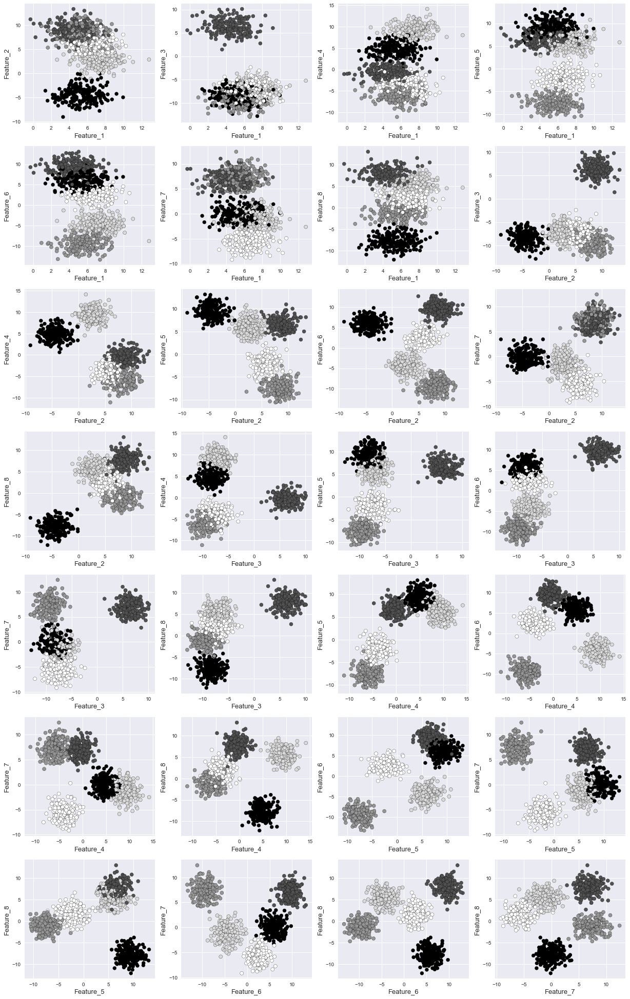

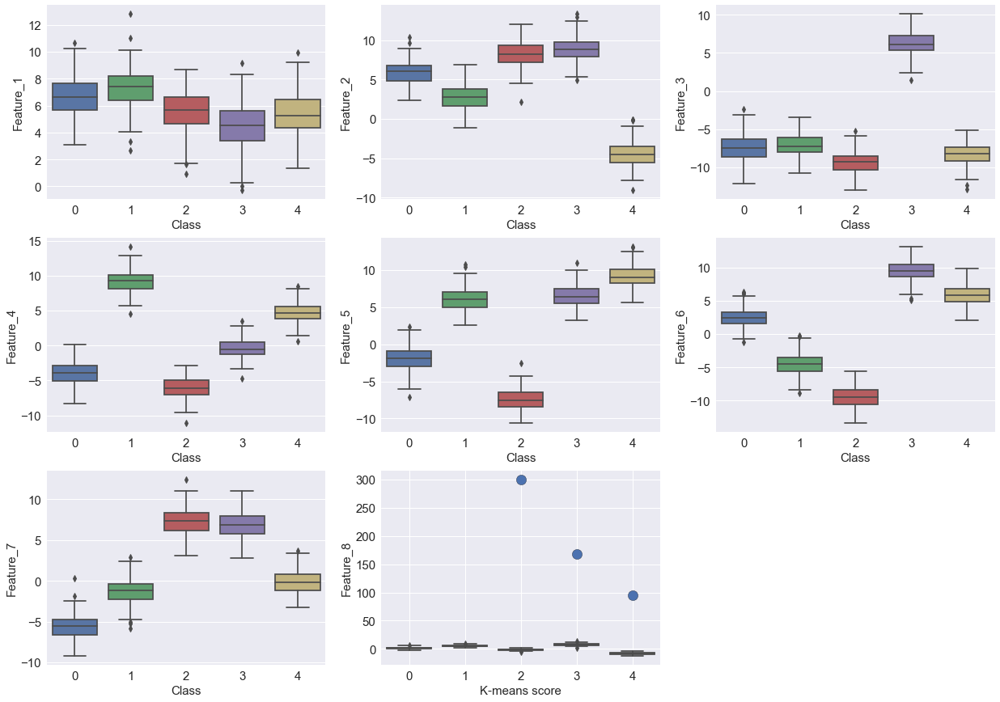

In [22]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

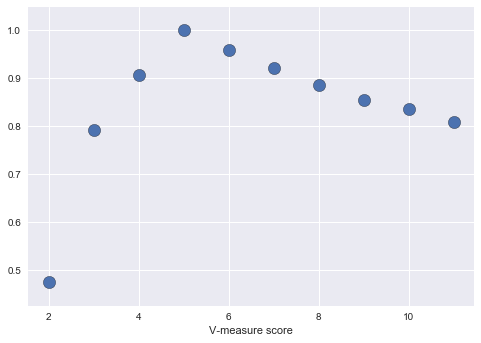

In [23]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measure score")
plt.show()

In [24]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [25]:
preds_km = km.predict(X_scaled)

In [26]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

In [27]:
from sklearn.mixture import GaussianMixture

In [28]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -12716.876873826306
Log-likelihood score for number of cluster(s) 2: 6.665833546827859
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -14609.164976935826
Log-likelihood score for number of cluster(s) 3: 7.767402092159717
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -15321.093624935078
Log-likelihood score for number of cluster(s) 4: 8.27879090993644
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -15939.356997055376
Log-likelihood score for number of cluster(s) 5: 8.743347089773687
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -15695.414499221277
Log-likelihood score for number of cluster(s) 6: 8.776800334633736
--

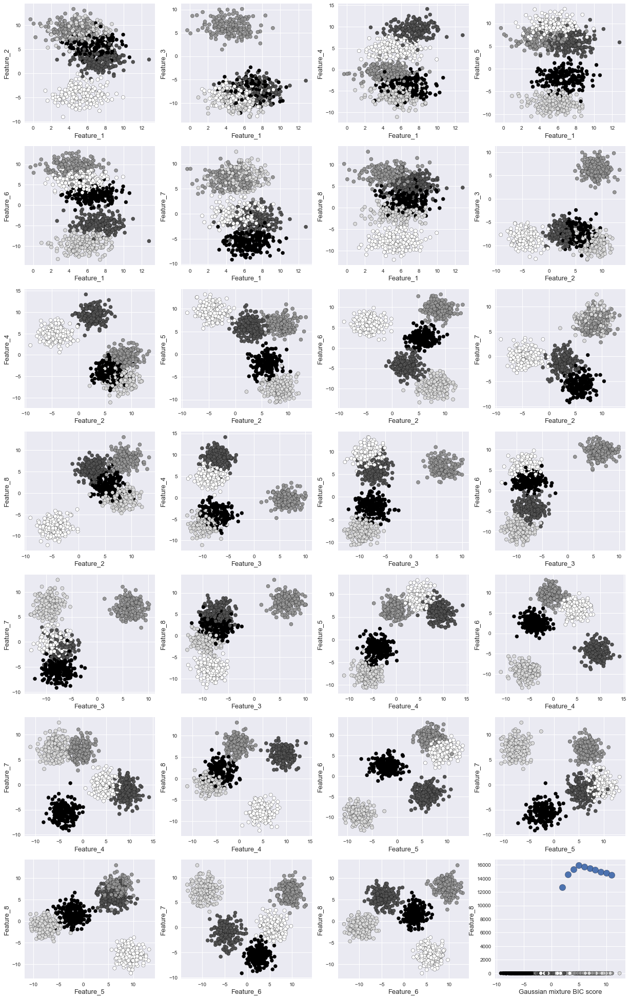

In [29]:
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Gaussian mixture BIC score")
plt.show()

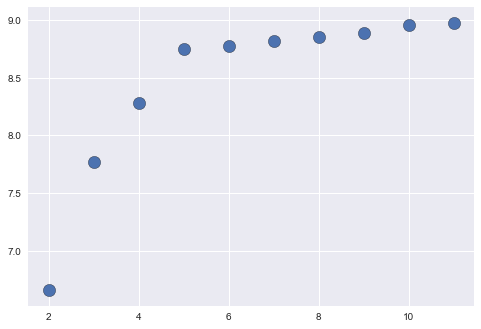

In [30]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.show()

In [31]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

Initialization 0
  Iteration 0
Initialization converged: True
Initialization 1
  Iteration 0
Initialization converged: True
Initialization 2
  Iteration 0
Initialization converged: True
Initialization 3
  Iteration 0
Initialization converged: True
Initialization 4
  Iteration 0
Initialization converged: True
Initialization 5
  Iteration 0
Initialization converged: True
Initialization 6
  Iteration 0
Initialization converged: True
Initialization 7
  Iteration 0
Initialization converged: True
Initialization 8
  Iteration 0
Initialization converged: True
Initialization 9
  Iteration 0
Initialization converged: True


In [32]:
gm.means_

array([[0.36300446, 0.80054251, 0.8351861 , 0.42290313, 0.72270624,
        0.86324668, 0.74477043, 0.79528566],
       [0.52942426, 0.6657594 , 0.23793773, 0.28393117, 0.36062676,
        0.599064  , 0.16454185, 0.54464061],
       [0.43330322, 0.20625551, 0.20375005, 0.62848151, 0.83525858,
        0.72865673, 0.42071996, 0.17103976],
       [0.45209788, 0.77318209, 0.15789053, 0.20234755, 0.13106554,
        0.14686844, 0.76558072, 0.43608346],
       [0.58240981, 0.52903276, 0.25481108, 0.80496511, 0.70086249,
        0.3357168 , 0.36630982, 0.70018833]])

In [33]:
km.cluster_centers_

array([[0.43330322, 0.20625551, 0.20375005, 0.62848151, 0.83525858,
        0.72865673, 0.42071996, 0.17103976],
       [0.45209788, 0.77318209, 0.15789053, 0.20234755, 0.13106554,
        0.14686844, 0.76558072, 0.43608346],
       [0.36300446, 0.80054251, 0.8351861 , 0.42290313, 0.72270624,
        0.86324668, 0.74477043, 0.79528566],
       [0.58240981, 0.52903276, 0.25481108, 0.80496511, 0.70086249,
        0.3357168 , 0.36630982, 0.70018833],
       [0.52942426, 0.6657594 , 0.23793773, 0.28393117, 0.36062676,
        0.599064  , 0.16454185, 0.54464061]])

In [34]:
gm.means_/km.cluster_centers_

array([[0.83776082, 3.88131448, 4.09907197, 0.67289669, 0.86524851,
        1.18470968, 1.77022843, 4.64971234],
       [1.17103904, 0.86106417, 1.50697916, 1.40318565, 2.75149944,
        4.07891568, 0.21492423, 1.24893663],
       [1.19365812, 0.25764467, 0.24395766, 1.48611223, 1.15573732,
        0.84408866, 0.56489885, 0.21506707],
       [0.77625388, 1.46150134, 0.61963761, 0.25137431, 0.18700607,
        0.4374772 , 2.08998143, 0.62280881],
       [1.10008145, 0.79463056, 1.07091495, 2.83507126, 1.94345668,
        0.56040223, 2.22624107, 1.285597  ]])

In [35]:
preds_gm=gm.predict(X_scaled)

In [36]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [37]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [38]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [39]:
silhouette_score(X_scaled,preds_km)

0.6743407836345098

In [40]:
silhouette_score(X_scaled,preds_gm)

0.6743407836345098

In [41]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## PCA

In [42]:
from sklearn.decomposition import PCA

In [43]:
n_prin_comp = 3

In [44]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

In [45]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [46]:
pca_explained_var = pca_full.explained_variance_ratio_

In [47]:
cum_explaiend_var = pca_explained_var.cumsum()

In [48]:
cum_explaiend_var

array([0.38106996, 0.71036326, 0.8379986 , 0.945953  , 0.9736089 ,
       0.98370776, 0.99227591, 1.        ])

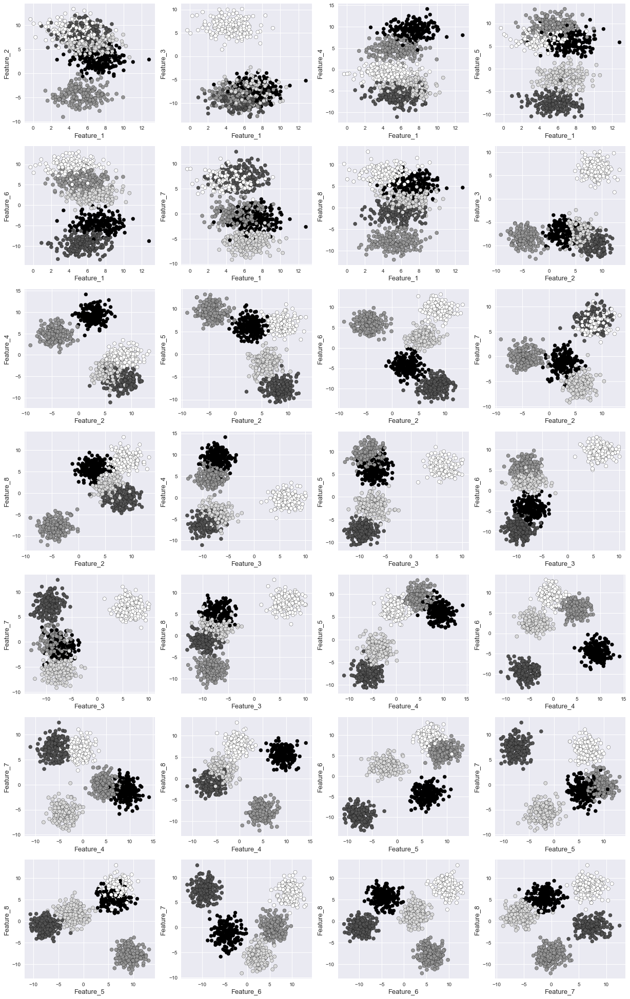

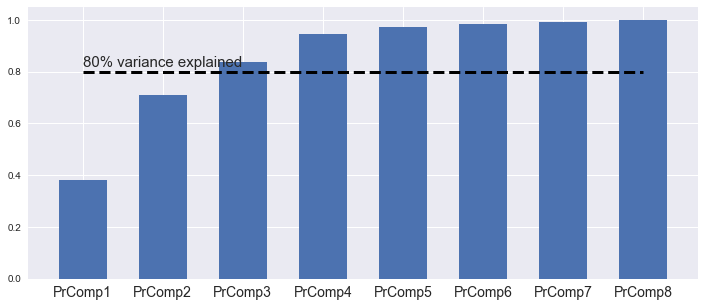

In [49]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],height=cum_explaiend_var,width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,xmin='PrComp1',xmax='PrComp8',linestyles='dashed',lw=3)
plt.text(x='PrComp1',y=0.82,s="80% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [50]:
X_pca = pca_partial.fit_transform(X_scaled)

In [51]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [52]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -227.5352428761106
Silhouette score for number of cluster(s) 2: 0.49135773575259944
V-measure score for number of cluster(s) 2: 0.4743509876140318
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -105.38086493705231
Silhouette score for number of cluster(s) 3: 0.5751135330588726
V-measure score for number of cluster(s) 3: 0.7665881447515969
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -39.623911414552005
Silhouette score for number of cluster(s) 4: 0.6870664844905016
V-measure score for number of cluster(s) 4: 0.8959235043677203
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -12.39486468550759
Silhouette score for number of cluster(s) 5: 0.7664980767108374
V-measure score for number of cluster

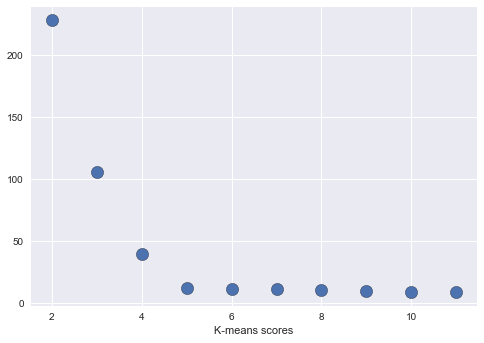

In [53]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means scores")
plt.show()

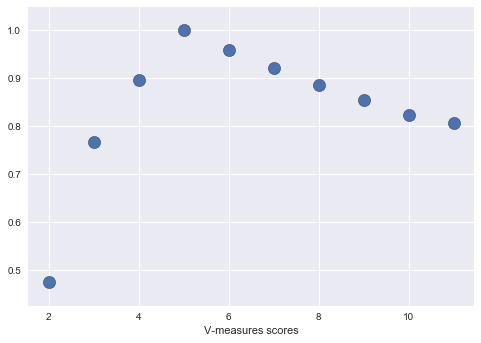

In [54]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measures scores")
plt.show()

### K-means fitting with PCA-transformed data

In [55]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [56]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

In [57]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## ICA

In [58]:
from sklearn.decomposition import FastICA

In [59]:
n_ind_comp = 3

In [60]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
    n_components=3, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [61]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

/Users/eli/anaconda3/lib/python3.6/site-packages/sklearn/decomposition/fastica_.py:116: UserWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn('FastICA did not converge. Consider increasing '


FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
    n_components=None, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [62]:
X_ica = ica_partial.fit_transform(X_scaled)

In [63]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Running k-means on the independent features

In [64]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.032838595760972
Silhouette score for number of cluster(s) 2: 0.430238357692052
V-measure score for number of cluster(s) 2: 0.4743509876140318
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.1319689413284166
Silhouette score for number of cluster(s) 3: 0.5732591924729062
V-measure score for number of cluster(s) 3: 0.7424834172925042
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.3330384803571448
Silhouette score for number of cluster(s) 4: 0.7181274434158429
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.12897149165505412
Silhouette score for number of cluster(s) 5: 0.7438577200345107
V-measure score for number of cluster

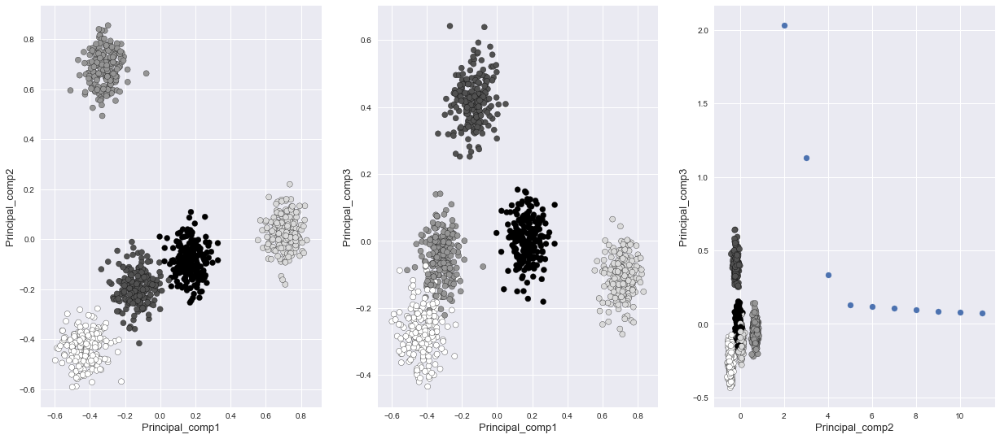

In [65]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

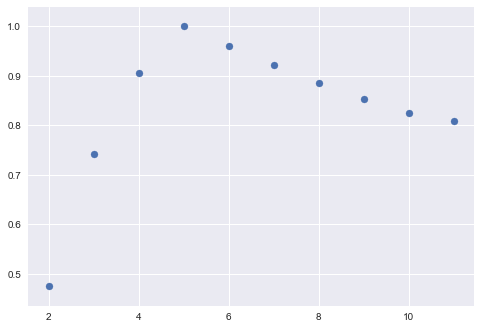

In [66]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with ICA-transformed data

In [67]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [68]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

In [69]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [70]:
from sklearn.random_projection import GaussianRandomProjection

In [71]:
n_random_comp = 3

In [72]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [73]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [74]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [75]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -212.89339791674655
Silhouette score for number of cluster(s) 2: 0.581831310580186
V-measure score for number of cluster(s) 2: 0.4743509876140318
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -115.390920641852
Silhouette score for number of cluster(s) 3: 0.5577946095139314
V-measure score for number of cluster(s) 3: 0.7381042100398578
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -57.698845728864654
Silhouette score for number of cluster(s) 4: 0.5994837989217138
V-measure score for number of cluster(s) 4: 0.8911204057016641
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -35.45615995890195
Silhouette score for number of cluster(s) 5: 0.6089227611088952
V-measure score for number of cluster(s)

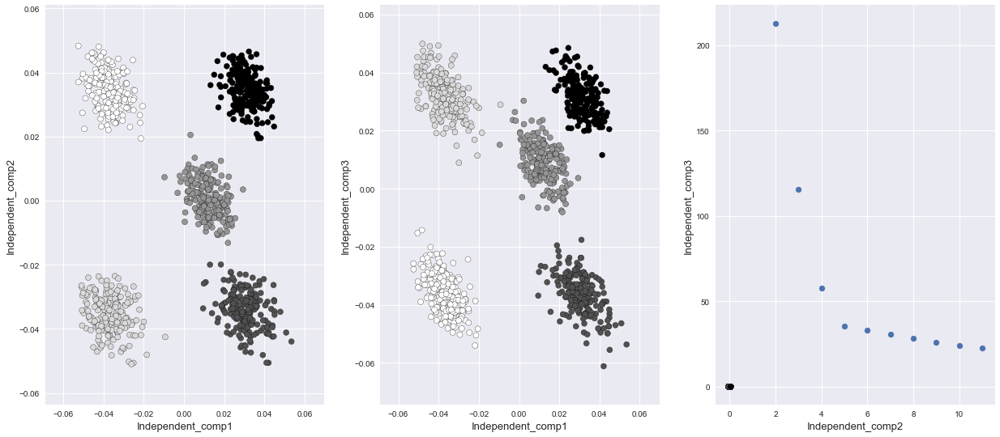

In [76]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

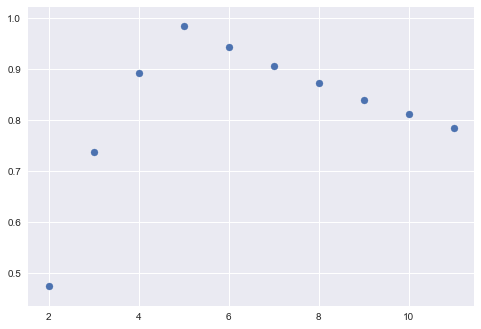

In [77]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### K-means fitting with random-projected data

In [78]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [79]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

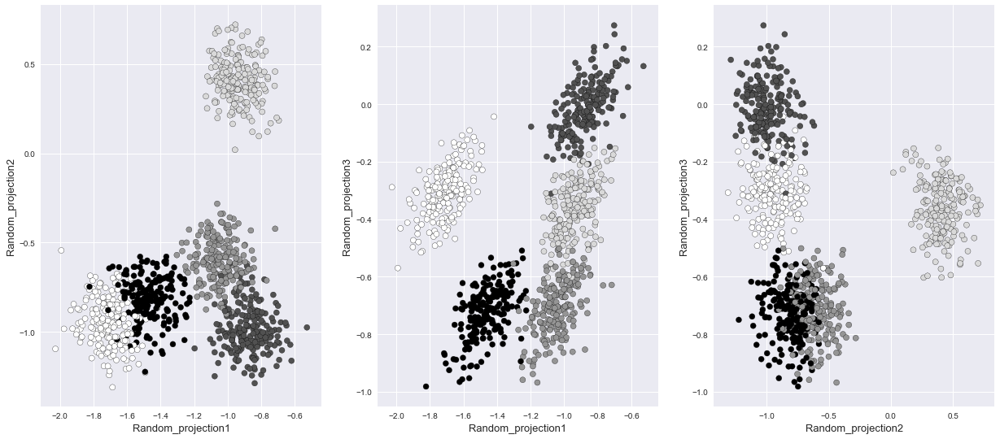

In [80]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [81]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -35.53572762831418
Silhouette score for iteration 0: 0.5755448427477815
V-measure score for iteration 0: 0.9586079912863761
----------------------------------------------------------------------------------------------------


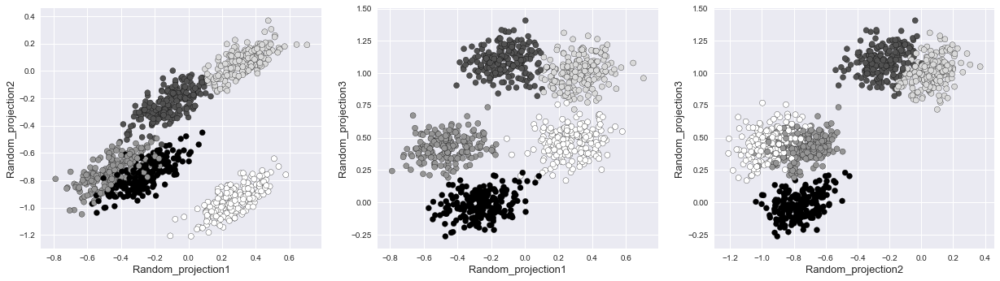

Score for iteration 1: -38.359378461187504
Silhouette score for iteration 1: 0.419882802301731
V-measure score for iteration 1: 0.7813995010904705
----------------------------------------------------------------------------------------------------


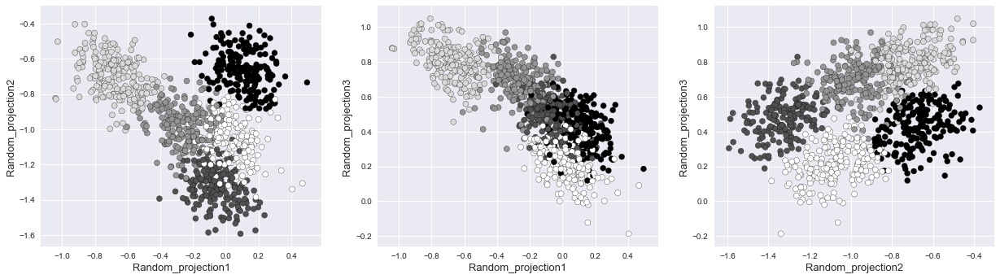

Score for iteration 2: -36.759617057275804
Silhouette score for iteration 2: 0.6803658193329977
V-measure score for iteration 2: 0.989121198097065
----------------------------------------------------------------------------------------------------


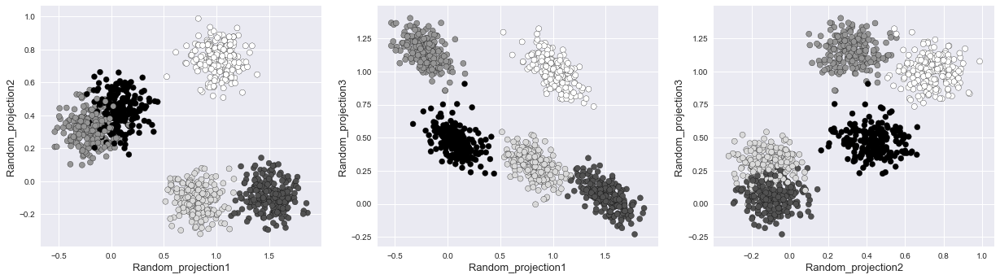

Score for iteration 3: -32.04328552152988
Silhouette score for iteration 3: 0.4608095552092957
V-measure score for iteration 3: 0.7612884497574798
----------------------------------------------------------------------------------------------------


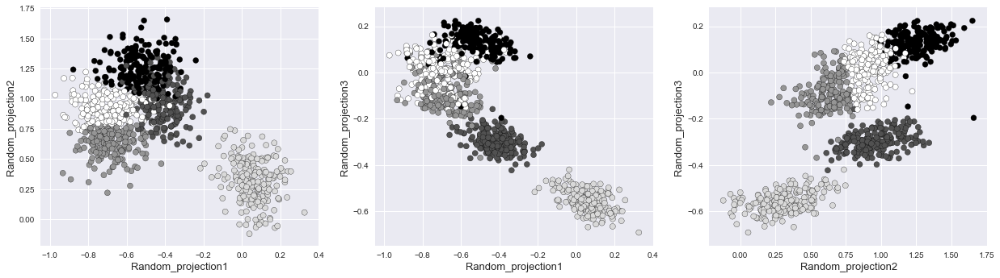

Score for iteration 4: -27.15755008653381
Silhouette score for iteration 4: 0.4707737179873864
V-measure score for iteration 4: 0.7848811043499603
----------------------------------------------------------------------------------------------------


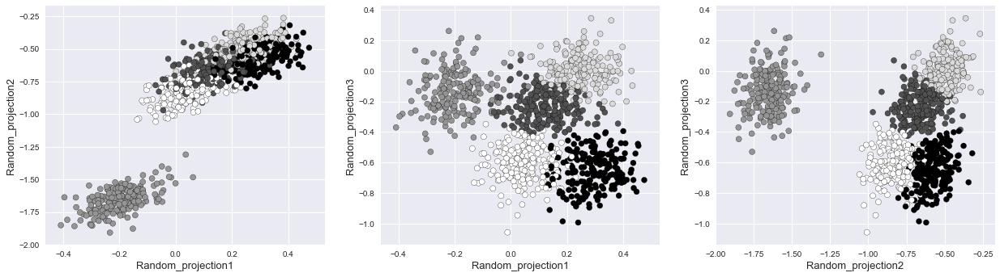

Score for iteration 5: -50.258322806105255
Silhouette score for iteration 5: 0.5434266684100976
V-measure score for iteration 5: 0.9486716445118389
----------------------------------------------------------------------------------------------------


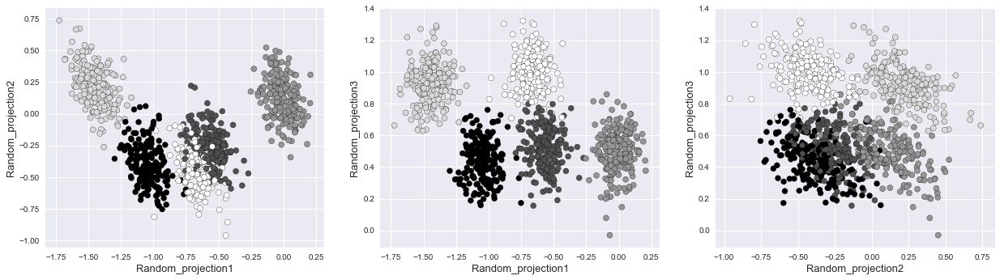

Score for iteration 6: -33.37113175080084
Silhouette score for iteration 6: 0.5091286002526322
V-measure score for iteration 6: 0.8945791269622411
----------------------------------------------------------------------------------------------------


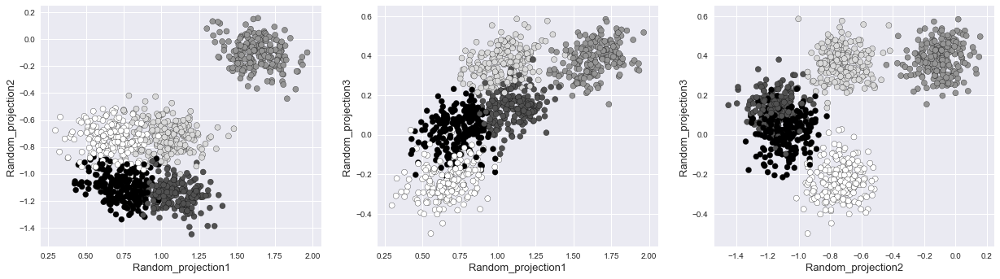

Score for iteration 7: -43.70434053601788
Silhouette score for iteration 7: 0.5358373914226836
V-measure score for iteration 7: 0.8357296990824866
----------------------------------------------------------------------------------------------------


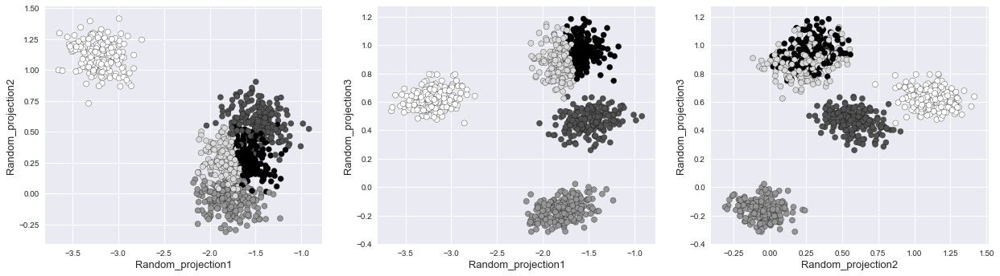

Score for iteration 8: -31.543306134122425
Silhouette score for iteration 8: 0.4395351788927558
V-measure score for iteration 8: 0.6511428777486234
----------------------------------------------------------------------------------------------------


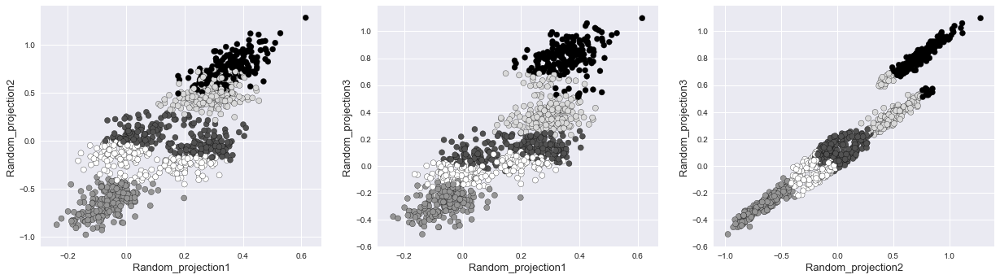

Score for iteration 9: -26.999699715667937
Silhouette score for iteration 9: 0.5650131539957347
V-measure score for iteration 9: 0.937022841155167
----------------------------------------------------------------------------------------------------


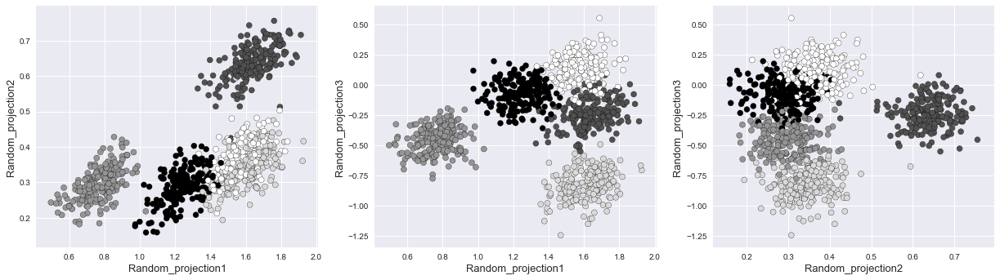

Score for iteration 10: -49.3408738055835
Silhouette score for iteration 10: 0.47920406242835084
V-measure score for iteration 10: 0.8548847337481996
----------------------------------------------------------------------------------------------------


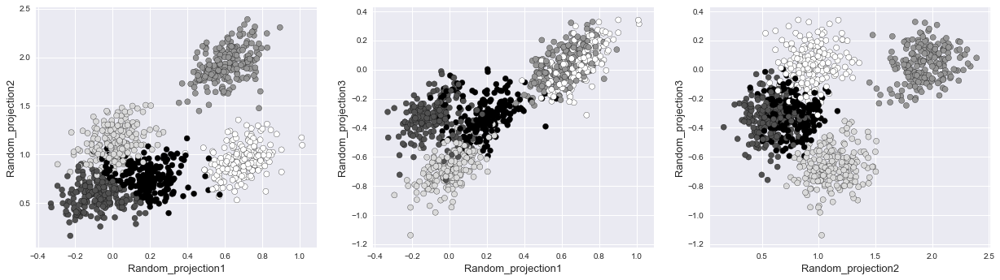

Score for iteration 11: -35.971045755380814
Silhouette score for iteration 11: 0.5315953715357891
V-measure score for iteration 11: 0.882859232522119
----------------------------------------------------------------------------------------------------


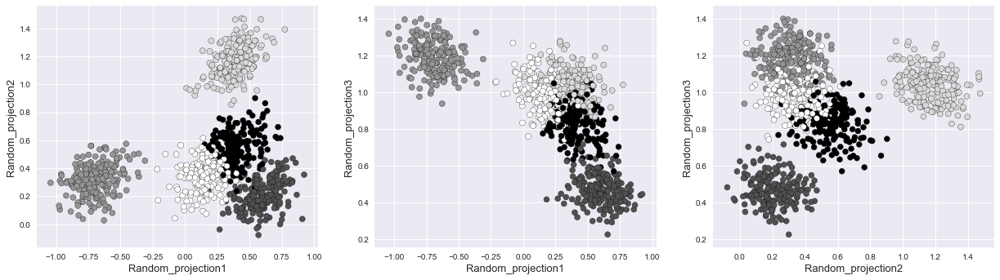

Score for iteration 12: -36.87783571611777
Silhouette score for iteration 12: 0.43699631296636315
V-measure score for iteration 12: 0.7671511437947169
----------------------------------------------------------------------------------------------------


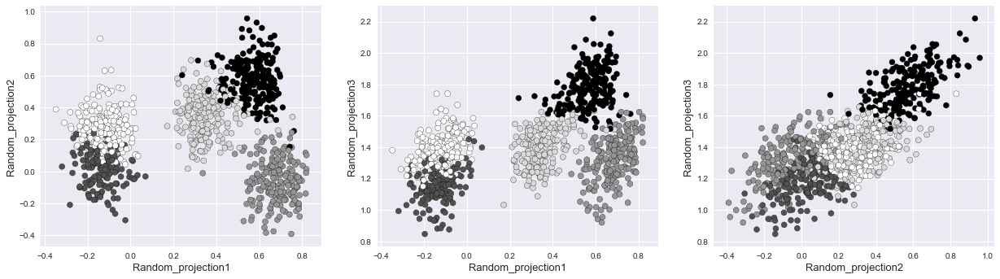

Score for iteration 13: -44.788723557345094
Silhouette score for iteration 13: 0.6903887795924369
V-measure score for iteration 13: 0.9960866319013288
----------------------------------------------------------------------------------------------------


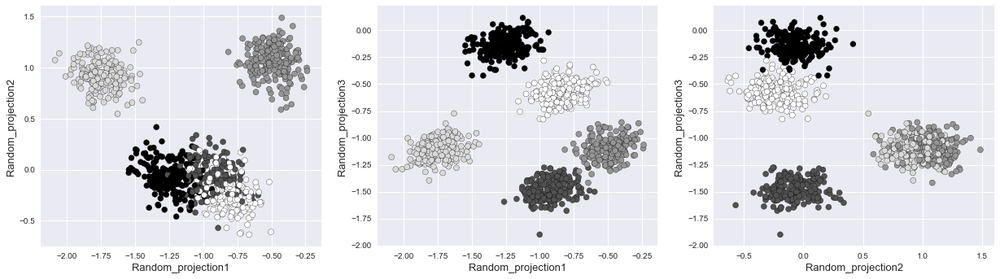

Score for iteration 14: -29.88391654182513
Silhouette score for iteration 14: 0.5395838696365389
V-measure score for iteration 14: 0.9667456599208677
----------------------------------------------------------------------------------------------------


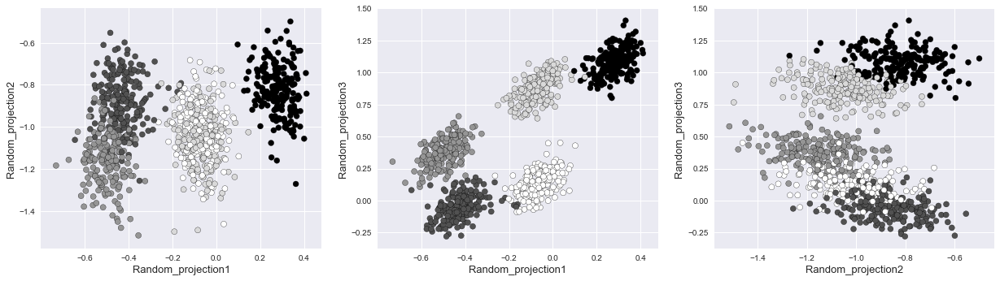

Score for iteration 15: -62.75644250224662
Silhouette score for iteration 15: 0.3857087306191978
V-measure score for iteration 15: 0.6747542780351566
----------------------------------------------------------------------------------------------------


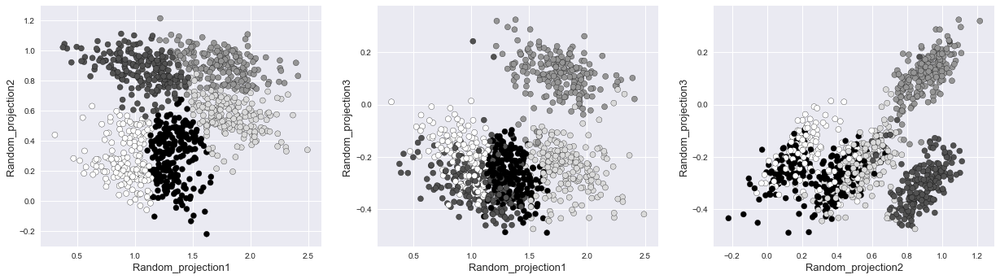

Score for iteration 16: -34.3979120665065
Silhouette score for iteration 16: 0.5241642613664192
V-measure score for iteration 16: 0.9448292731030234
----------------------------------------------------------------------------------------------------


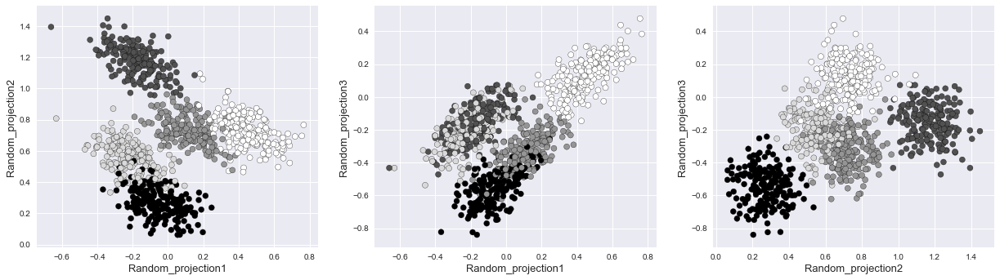

Score for iteration 17: -25.256869484976406
Silhouette score for iteration 17: 0.5616609428308097
V-measure score for iteration 17: 0.9137129754579446
----------------------------------------------------------------------------------------------------


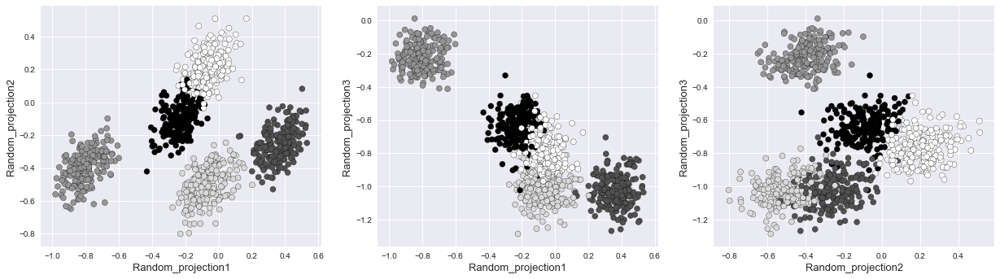

Score for iteration 18: -42.84731546939078
Silhouette score for iteration 18: 0.5219545790289307
V-measure score for iteration 18: 0.947126104411303
----------------------------------------------------------------------------------------------------


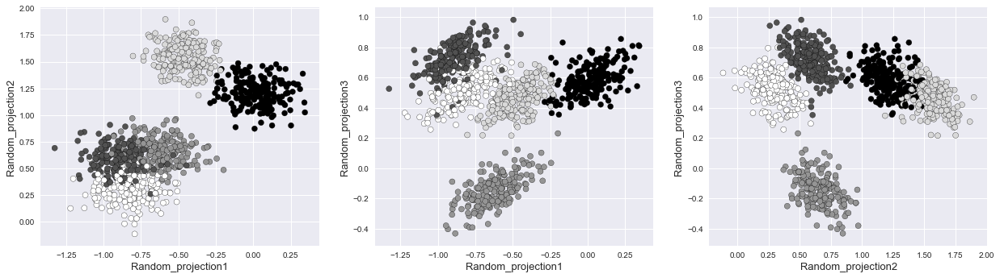

Score for iteration 19: -54.85374586835246
Silhouette score for iteration 19: 0.5275445159880149
V-measure score for iteration 19: 0.8443482278701423
----------------------------------------------------------------------------------------------------


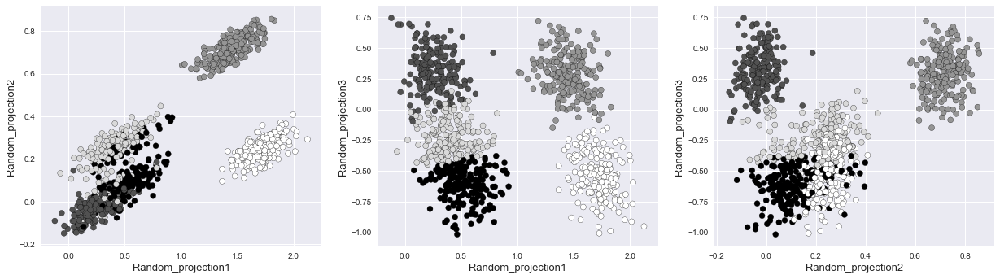

In [82]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

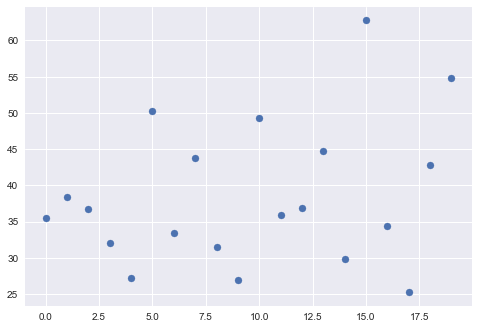

In [83]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

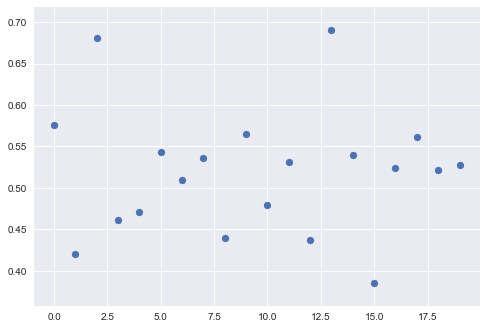

In [84]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

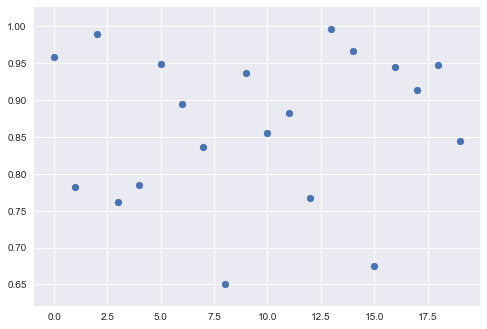

In [85]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [86]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -12.39486468550759
Silhouette score for iteration 0: 0.7664980767108374
V-measure score for iteration 0: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 1: -12.39486468550759
Silhouette score for iteration 1: 0.7664980767108374
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 2: -12.39486468550759
Silhouette score for iteration 2: 0.7664980767108374
V-measure score for iteration 2: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 3: -12.39486468550759
Silhouette score for iteration 3: 0.7664980767108374
V-measure score for iteration 3: 1.0
----------------------------------------------------------------------------------------------------
Score for iteration 4: -12.39486468550759
Silhouette score for itera